In [1]:
#con el environment scvi-tune
import os
import scanpy as sc
import skmisc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import gzip
from matplotlib.pyplot import rc_context
import anndata as ad  # Importa anndata
import numpy as np

sc.set_figure_params(dpi=100)

In [2]:
import scvi

In [3]:
import numpy as np
print(np.__version__)

1.24.3


In [11]:
import warnings
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)

GUARDAMOS LOS PACIENTES CONCATENADOS PARA EL SCVI TRANSFORM

In [4]:
pt_14 = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_14_filtered_QC_mixto.h5ad")
pt_17 = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_17_filtered_QC_mixto.h5ad")
pt_20 = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_20_filtered_QC_mixto.h5ad")
pt_22 = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_22_filtered_QC_mixto.h5ad")
pt_28 = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_28_filtered_QC_mixto.h5ad")

In [5]:
# Cargar los nuevos pacientes
pt_18 = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_18_filtered_QC_mixto.h5ad")
pt_14_pan = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_14_pan_filtered_QC_mixto.h5ad")
pt_41 = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_41_filtered_QC_mixto.h5ad")
pt_49 = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_49_filtered_QC_mixto.h5ad")
pt_50 = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_50_filtered_QC_mixto.h5ad")

In [9]:
# Revisar las capas disponibles en cada objeto
patients = {
    "PT_14": pt_14,
    "PT_17": pt_17,
    "PT_20": pt_20,
    "PT_22": pt_22,
    "PT_28": pt_28,
    "PT_18": pt_18,
    "PT_14_pan": pt_14_pan,
    "PT_41": pt_41,
    "PT_49": pt_49,
    "PT_50": pt_50,
}

for name, adata in patients.items():
    print(f"{name} tiene las capas: {list(adata.layers.keys())}")

PT_14 tiene las capas: ['counts_soupx_crude', 'raw_counts', 'soupX_counts']
PT_17 tiene las capas: ['counts_soupx_crude', 'raw_counts', 'soupX_counts']
PT_20 tiene las capas: ['counts_soupx_crude', 'raw_counts', 'soupX_counts']
PT_22 tiene las capas: ['counts_soupx_crude', 'raw_counts', 'soupX_counts']
PT_28 tiene las capas: ['counts_soupx_crude', 'raw_counts', 'soupX_counts']
PT_18 tiene las capas: ['counts_soupx_crude', 'original_counts']
PT_14_pan tiene las capas: ['counts_soupx_crude', 'original_counts']
PT_41 tiene las capas: ['counts_soupx_crude', 'original_counts']
PT_49 tiene las capas: ['counts_soupx_crude', 'original_counts']
PT_50 tiene las capas: ['counts_soupx_crude', 'original_counts']


In [10]:
# Modificar capas de los pacientes PT_14 a PT_28
for name, adata in [("PT_14", pt_14), ("PT_17", pt_17), ("PT_20", pt_20), ("PT_22", pt_22), ("PT_28", pt_28)]:
    # Eliminar la capa 'soupX_counts'
    if "soupX_counts" in adata.layers.keys():
        del adata.layers["soupX_counts"]
        print(f"Eliminada la capa 'soupX_counts' de {name}")
    # Renombrar 'raw_counts' a 'original_counts'
    if "raw_counts" in adata.layers.keys():
        adata.layers["original_counts"] = adata.layers["raw_counts"]
        del adata.layers["raw_counts"]
        print(f"Renombrada la capa 'raw_counts' a 'original_counts' en {name}")

Eliminada la capa 'soupX_counts' de PT_14
Renombrada la capa 'raw_counts' a 'original_counts' en PT_14
Eliminada la capa 'soupX_counts' de PT_17
Renombrada la capa 'raw_counts' a 'original_counts' en PT_17
Eliminada la capa 'soupX_counts' de PT_20
Renombrada la capa 'raw_counts' a 'original_counts' en PT_20
Eliminada la capa 'soupX_counts' de PT_22
Renombrada la capa 'raw_counts' a 'original_counts' en PT_22
Eliminada la capa 'soupX_counts' de PT_28
Renombrada la capa 'raw_counts' a 'original_counts' en PT_28


In [11]:
# Verificar las capas tras los cambios
for name, adata in [("PT_14", pt_14), ("PT_17", pt_17), ("PT_20", pt_20), ("PT_22", pt_22), ("PT_28", pt_28)]:
    print(f"{name} tiene ahora las capas: {list(adata.layers.keys())}")

PT_14 tiene ahora las capas: ['counts_soupx_crude', 'original_counts']
PT_17 tiene ahora las capas: ['counts_soupx_crude', 'original_counts']
PT_20 tiene ahora las capas: ['counts_soupx_crude', 'original_counts']
PT_22 tiene ahora las capas: ['counts_soupx_crude', 'original_counts']
PT_28 tiene ahora las capas: ['counts_soupx_crude', 'original_counts']


In [12]:
adata_concat_mixto = ad.concat(
    [pt_14, pt_17, pt_20, pt_22, pt_28, pt_18, pt_14_pan, pt_41, pt_49, pt_50],
    label="Sample",  # Añadir columna que indica el origen de cada celda
    keys=["PT_14", "PT_17", "PT_20", "PT_22", "PT_28", "PT_18", "PT_14_pan", "PT_41", "PT_49", "PT_50"],
    join="outer"  # Para incluir todas las variables
)

# Comprobar el resultado
print(adata_concat_mixto)

AnnData object with n_obs × n_vars = 53542 × 23209
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    layers: 'counts_soupx_crude', 'original_counts'


In [14]:
# Verificar las capas tras la concatenación
print(f"Capas tras la concatenación: {list(adata_concat_mixto.layers.keys())}")

Capas tras la concatenación: ['counts_soupx_crude', 'original_counts']


Estas capas no estan normalizadas, por lo que se deben normalizar antes de ser usadas en el modelo.

In [16]:
# Comprobar si la capa 'counts_soupx_crude' está normalizada
counts_soupx_crude_dense = adata_concat_mixto.layers['counts_soupx_crude'].todense()
counts_soupx_crude_totals = counts_soupx_crude_dense.sum(axis=1).A1  # Convertir a array 1D
print(f"Suma total por célula en 'counts_soupx_crude' (primeras 10 células): {counts_soupx_crude_totals[:10]}")

# Comprobar si la capa 'original_counts' está normalizada
original_counts_dense = adata_concat_mixto.layers['original_counts'].todense()
original_counts_totals = original_counts_dense.sum(axis=1).A1  # Convertir a array 1D
print(f"Suma total por célula en 'original_counts' (primeras 10 células): {original_counts_totals[:10]}")

# Verificar rangos de valores
print(f"Rangos en 'counts_soupx_crude': min={counts_soupx_crude_dense.min()}, max={counts_soupx_crude_dense.max()}")
print(f"Rangos en 'original_counts': min={original_counts_dense.min()}, max={original_counts_dense.max()}")

Suma total por célula en 'counts_soupx_crude' (primeras 10 células): [3395. 5747. 5610. 5224. 4626. 3164. 5240. 3300. 4405. 6643.]
Suma total por célula en 'original_counts' (primeras 10 células): [3516. 5973. 5816. 5437. 4811. 3262. 5449. 3389. 4580. 6940.]
Rangos en 'counts_soupx_crude': min=0.0, max=782.0
Rangos en 'original_counts': min=0.0, max=784.0


In [16]:
#guardamos el objeto para crear el modelo en scvi
# Guardar el objeto adata_concat_mixto en la ruta especificada
#adata_concat_mixto.write("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/processed_data_for_scvi/adata_mixto_processed.h5ad")

In [4]:
# Cargar los datos
# adata_concat_mixto = ad.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/processed_data_for_scvi/adata_mixto_processed.h5ad")
# adata_concat_mixto

AnnData object with n_obs × n_vars = 32370 × 22511
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    layers: 'counts_soupx_crude', 'raw_counts', 'soupX_counts'

In [27]:
# # Esto ha llegado a tardar 9 min
# # Crear una copia del objeto original
# adata_no_integrated = adata_concat_mixto.copy()

# # Asegúrate de que 'counts_soupx_crude' está correctamente configurado
# adata_no_integrated.X = adata_no_integrated.layers['counts_soupx_crude'].copy()

# # Normalizar los datos
# sc.pp.normalize_total(adata_no_integrated, target_sum=1e4)

# # Aplicar log1p
# sc.pp.log1p(adata_no_integrated)

# # Calcular PCA
# sc.pp.pca(adata_no_integrated, n_comps=50)

# # Calcular vecinos
# sc.pp.neighbors(adata_no_integrated)  # Puedes ajustar n_neighbors según sea necesario

# # Calcular t-SNE
# sc.tl.tsne(adata_no_integrated)

# # Calcular UMAP
# sc.tl.umap(adata_no_integrated)


In [28]:
#estos datos estan log normalizados, solo los usamos para la visualizacion
# adata_no_integrated

AnnData object with n_obs × n_vars = 32370 × 22511
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    uns: 'log1p', 'pca', 'neighbors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts_soupx_crude', 'raw_counts', 'soupX_counts'
    obsp: 'distances', 'connectivities'

In [17]:
adata_concat_mixto.write("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/processed_data_for_scvi/adata_concatenados_10_pt.h5ad")

# VAMOS A PROBAR DISTINTOS METODOS DE INTEGRACION

In [6]:
adata_concat_mixto = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/04_datos_concatenados/adata_concatenados_10_pt.h5ad")

## Preparación de los datos
### Vamos a integrar BBKN, COMBAT y Scanorama

En el tutorial de: https://nbisweden.github.io/workshop-scRNAseq/labs/scanpy/scanpy_03_integration.html
Nosotros usamos el script run_scanpy_integration.py en el que ya normalizamos y seleccionamos los genes más variables.

In [18]:
adata = adata_concat_mixto.copy()
# Asegúrate de que adata.layers['counts_soupx_crude'] esté correctamente configurado
adata.X = adata.layers['counts_soupx_crude'].copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

#Detect variable genes in each dataset separately using the batch_key parameter.
# Modificar esta línea para incluir observed=False
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key='Sample')

In [19]:
print("Highly variable genes intersection: %d"%sum(adata.var.highly_variable_intersection))
print("Number of batches where gene is variable:")
print(adata.var.highly_variable_nbatches.value_counts())
var_genes_batch = adata.var.highly_variable_nbatches > 0

Highly variable genes intersection: 330
Number of batches where gene is variable:
highly_variable_nbatches
0     16663
1      3081
2      1055
3       545
4       354
10      330
9       260
5       253
6       244
8       215
7       209
Name: count, dtype: int64


In [20]:
#Compare overlap of variable genes with batches or with all data.
var_genes_all = adata.var.highly_variable
print("Any batch var genes: %d"%sum(var_genes_batch))
print("All data var genes: %d"%sum(var_genes_all))
print("Overlap: %d"%sum(var_genes_batch & var_genes_all))
print("Variable genes in all batches: %d"%sum(adata.var.highly_variable_nbatches == 10))
print("Overlap batch instersection and all: %d"%sum(var_genes_all & adata.var.highly_variable_intersection))

Any batch var genes: 6546
All data var genes: 1727
Overlap: 1724
Variable genes in all batches: 330
Overlap batch instersection and all: 330


In [21]:
#Select all genes that are variable in at least 2 datasets and use for remaining analysis.
var_select = adata.var.highly_variable_nbatches > 2
var_genes = var_select.index[var_select]
len(var_genes)

1459

#### A) INTEGRACION CON BBKNN

Mirar mas adelante despues de haber hecho la integracion con harmony:

In [ ]:
#tarda hasta 8 min no desesperar
import bbknn
import numpy as np

# Crear una copia del objeto AnnData concatenado
adata_bbknn = adata_concat_mixto.copy()

# Verificar y asignar la capa 'counts_soupx_crude' a X como matriz densa y asegurar compatibilidad
if 'counts_soupx_crude' in adata_bbknn.layers:
    counts_soupx_crude = adata_bbknn.layers['counts_soupx_crude']
    if counts_soupx_crude.shape == adata_bbknn.shape:
        adata_bbknn.X = np.array(counts_soupx_crude.todense())  # Convertir a np.array de forma segura
    else:
        raise ValueError(
            f"La matriz 'counts_soupx_crude' tiene forma {counts_soupx_crude.shape}, "
            f"pero se esperaba {adata_bbknn.shape}."
        )
else:
    raise KeyError("La capa 'counts_soupx_crude' no está disponible en el objeto AnnData.")

# Normalizar los datos y aplicar log-transform
sc.pp.normalize_total(adata_bbknn, target_sum=1e4)
sc.pp.log1p(adata_bbknn)

# Detectar genes altamente variables considerando los lotes (opcional para mejorar la integración)
sc.pp.highly_variable_genes(adata_bbknn, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key='Sample')

# Convertir X a np.array antes de la regresión
adata_bbknn.X = np.asarray(adata_bbknn.X)

# Aplicar regresión de cresta ajustando por covariables técnicas (mitocondriales y ribosomales)
bbknn.ridge_regression(
    adata=adata_bbknn,
    batch_key='Sample',  # Nombre de la columna en .obs que indica el lote
    confounder_key=['pct_counts_mt', 'pct_counts_ribo']  # Covariables a ajustar
)

# Calcular PCA
sc.pp.pca(adata_bbknn, n_comps=50)

# Aplicar BBKNN
bbknn.bbknn(adata_bbknn, batch_key='Sample')


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

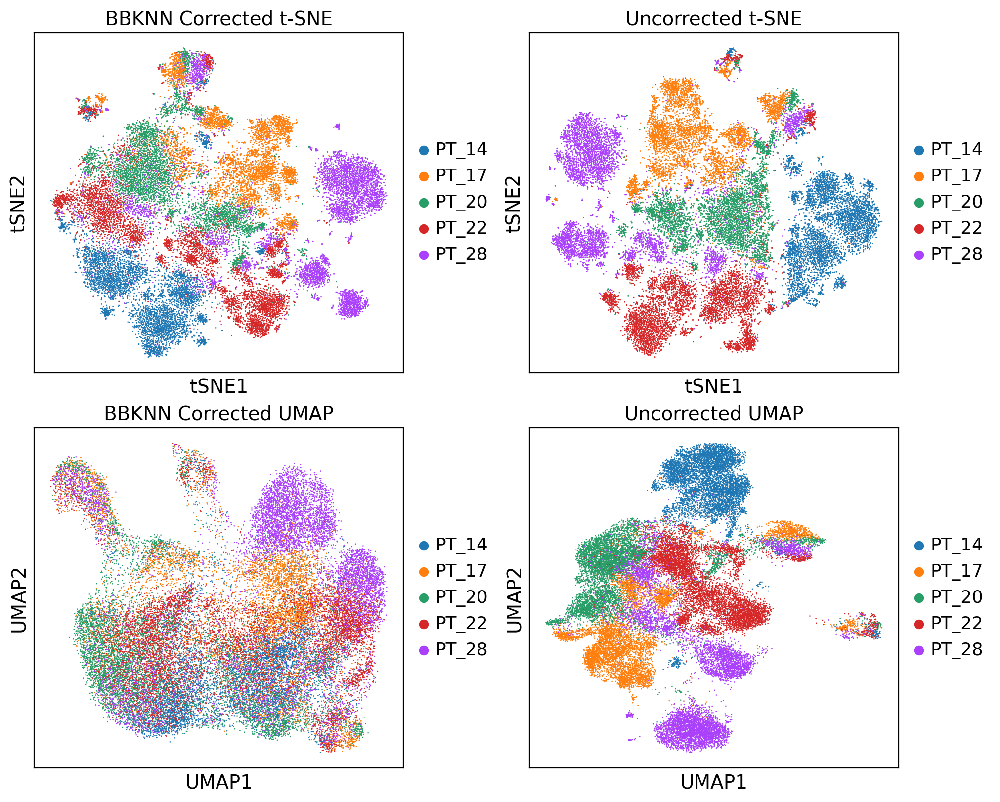

In [29]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8), constrained_layout=True)
sc.pl.tsne(adata_bbknn, color="Sample", title="BBKNN Corrected t-SNE", ax=axs[0, 0], show=False)
sc.pl.tsne(adata_no_integrated, color="Sample", title="Uncorrected t-SNE", ax=axs[0, 1], show=False)
sc.pl.umap(adata_bbknn, color="Sample", title="BBKNN Corrected UMAP", ax=axs[1, 0], show=False)
sc.pl.umap(adata_no_integrated, color="Sample", title="Uncorrected UMAP", ax=axs[1, 1], show=False)
plt.show()

In [30]:
save_file = '/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/integracion_scanpy/integrated_bbknn.h5ad'
adata_bbknn.write_h5ad(save_file)

#### B) INTEGRACION CON COMBAT

In [33]:
# 1. Crear un nuevo objeto con los conteos log-normalizados, que ya estan por defecto. 
adata_combat = sc.AnnData(X=adata_no_integrated.X, var=adata_no_integrated.var, obs=adata_no_integrated.obs)

In [34]:
# 2. Almacenar los datos originales en raw
adata_combat.raw = adata_combat
# 3. Ejecutar Combat
sc.pp.combat(adata_combat, key='Sample')

/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/preprocessing/_combat.py:199: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  batch_info = model.groupby(key).indices.values()
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/preprocessing/_combat.py:95: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  batch_items = model.groupby(batch_key).groups.items()


Found 1 genes with zero variance.


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/preprocessing/_combat.py:340: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/preprocessing/_combat.py:340: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


Highly variable genes: 1954


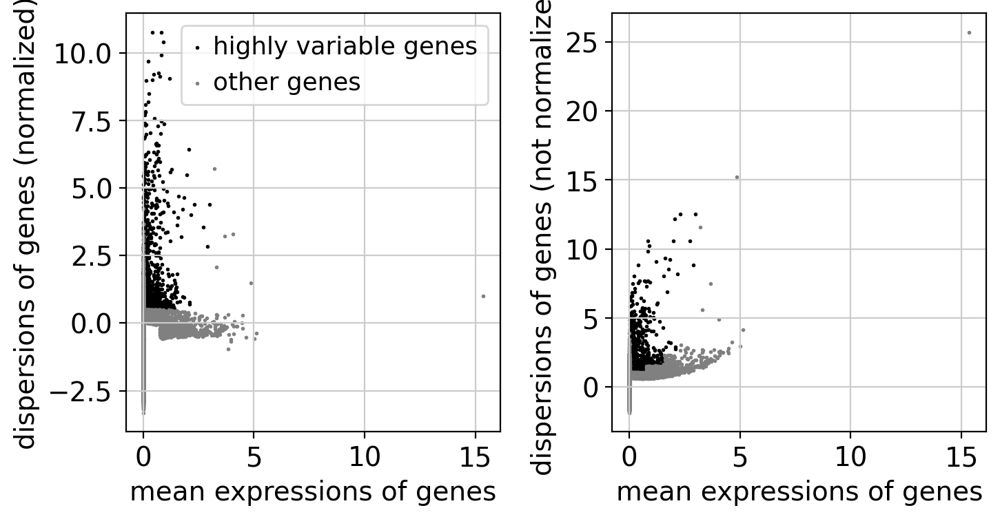

In [35]:
# Esto puede tardar unos 6 minutos
sc.pp.highly_variable_genes(adata_combat)
print("Highly variable genes: %d"%sum(adata_combat.var.highly_variable))
sc.pl.highly_variable_genes(adata_combat)
sc.pp.pca(adata_combat, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata_combat)
sc.tl.umap(adata_combat)
sc.tl.tsne(adata_combat)

In [36]:
# compare var_genes
var_genes_combat = adata_combat.var.highly_variable
print("With all data %d"%sum(var_genes_all))
print("With combat %d"%sum(var_genes_combat))
print("Overlap %d"%sum(var_genes_all & var_genes_combat))

print("With 2 batches %d"%sum(var_select))
print("Overlap %d"%sum(var_genes_combat & var_select))

With all data 1687
With combat 1954
Overlap 1337
With 2 batches 1459
Overlap 1153


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

<Axes: title={'center': 'Combat umap'}, xlabel='UMAP1', ylabel='UMAP2'>

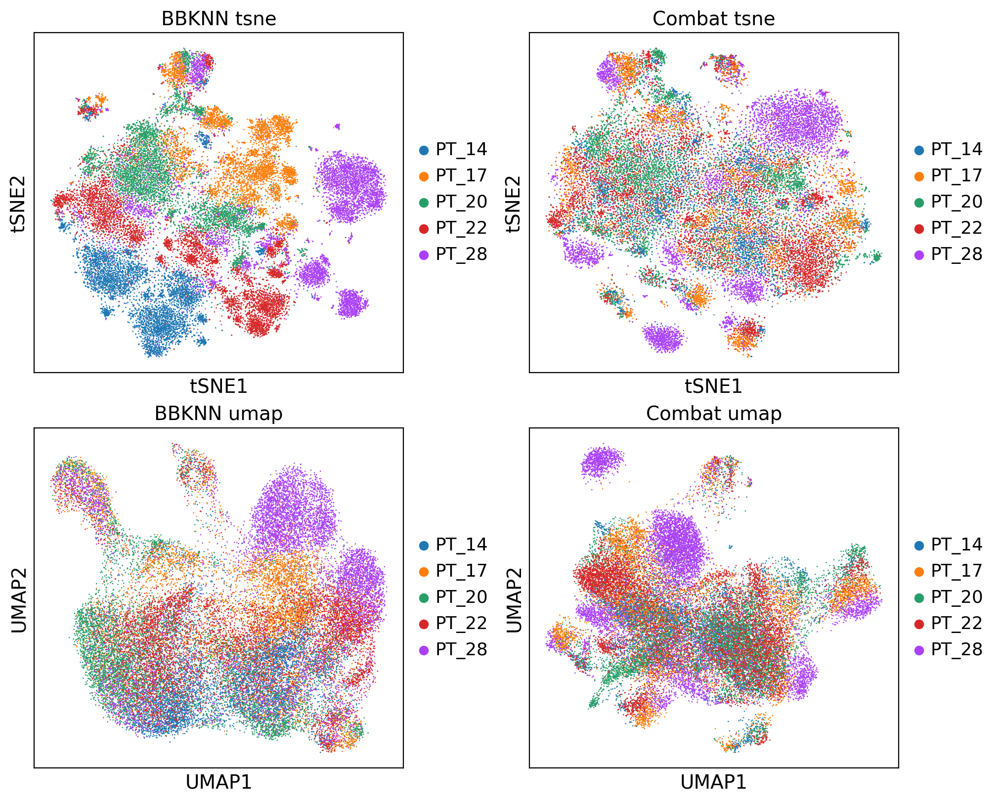

In [37]:
fig, axs = plt.subplots(2, 2, figsize=(10,8),constrained_layout=True)
sc.pl.tsne(adata_bbknn, color="Sample", title="BBKNN tsne", ax=axs[0,0], show=False)
sc.pl.tsne(adata_combat, color="Sample", title="Combat tsne", ax=axs[0,1], show=False)
sc.pl.umap(adata_bbknn, color="Sample", title="BBKNN umap", ax=axs[1,0], show=False)
sc.pl.umap(adata_combat, color="Sample", title="Combat umap", ax=axs[1,1], show=False)

In [38]:
#save to file
save_file = '/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/integracion_scanpy/integration_combat.h5ad'
adata_combat.write_h5ad(save_file)

Los modelos globales, como ComBat, suponen que el efecto de batch afecta a todas las células de manera similar y ajustan este efecto como una corrección aditiva y/o multiplicativa. Esto es más sencillo de aplicar a datos de transcriptómica a granel, donde la variabilidad entre células está promediada. Sin embargo, en datos de transcriptómica de células individuales, donde cada célula puede responder de forma diferente a los efectos técnicos, estos métodos pueden ser menos adecuados, lo que ha llevado al desarrollo de métodos de ajuste más específicos para scRNA-seq.

#### C) INTEGRACION CON SCANORAMA

In [39]:
# split per batch into new objects.
batches = adata_no_integrated.obs['Sample'].cat.categories.tolist()
alldata = {}
for batch in batches:
    alldata[batch] = adata[adata.obs['Sample'] == batch,]

alldata   

{'PT_14': View of AnnData object with n_obs × n_vars = 6291 × 22511
     obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
     var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
     uns: 'log1p', 'hvg'
     layers: 'counts_soupx_crude', 'raw_counts', 'soupX_counts',
 'PT_17': View of AnnData object with n_obs × n_vars = 6304 × 22511
     obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    

In [41]:
import scanorama

#subset the individual dataset to the variable genes we defined at the beginning
alldata2 = dict()
for ds in alldata.keys():
    print(ds)
    alldata2[ds] = alldata[ds][:,var_genes]

#convert to list of AnnData objects
adatas = list(alldata2.values())

# run scanorama.integrate
scanorama.integrate_scanpy(adatas, dimred = 50)

PT_14
PT_17
PT_20
PT_22
PT_28
Found 1459 genes among all datasets
[[0.         0.26713198 0.25671594 0.53139405 0.2821491 ]
 [0.         0.         0.61586162 0.32818359 0.297851  ]
 [0.         0.         0.         0.53280026 0.53394256]
 [0.         0.         0.         0.         0.5080246 ]
 [0.         0.         0.         0.         0.        ]]
Processing datasets (1, 2)
Processing datasets (2, 4)
Processing datasets (2, 3)
Processing datasets (0, 3)
Processing datasets (3, 4)
Processing datasets (1, 3)
Processing datasets (1, 4)
Processing datasets (0, 4)
Processing datasets (0, 1)
Processing datasets (0, 2)


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanorama/scanorama.py:284: ImplicitModificationWarning: Setting element `.obsm['X_scanorama']` of view, initializing view as actual.
  adata.obsm['X_scanorama'] = X_dimred


In [42]:
#scanorama adds the corrected matrix to adata.obsm in each of the datasets in adatas.
adatas[0].obsm['X_scanorama'].shape

(6291, 50)

In [43]:
# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object, create a new object first
adata_sc = adata_no_integrated.copy()
adata_sc.obsm["Scanorama"] = all_s

(32370, 50)


In [44]:
# tsne and umap
sc.pp.neighbors(adata_sc, n_pcs =30, use_rep = "Scanorama")
sc.tl.umap(adata_sc)
sc.tl.tsne(adata_sc, n_pcs = 30, use_rep = "Scanorama")

/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

<Axes: title={'center': 'Scanorama umap'}, xlabel='UMAP1', ylabel='UMAP2'>

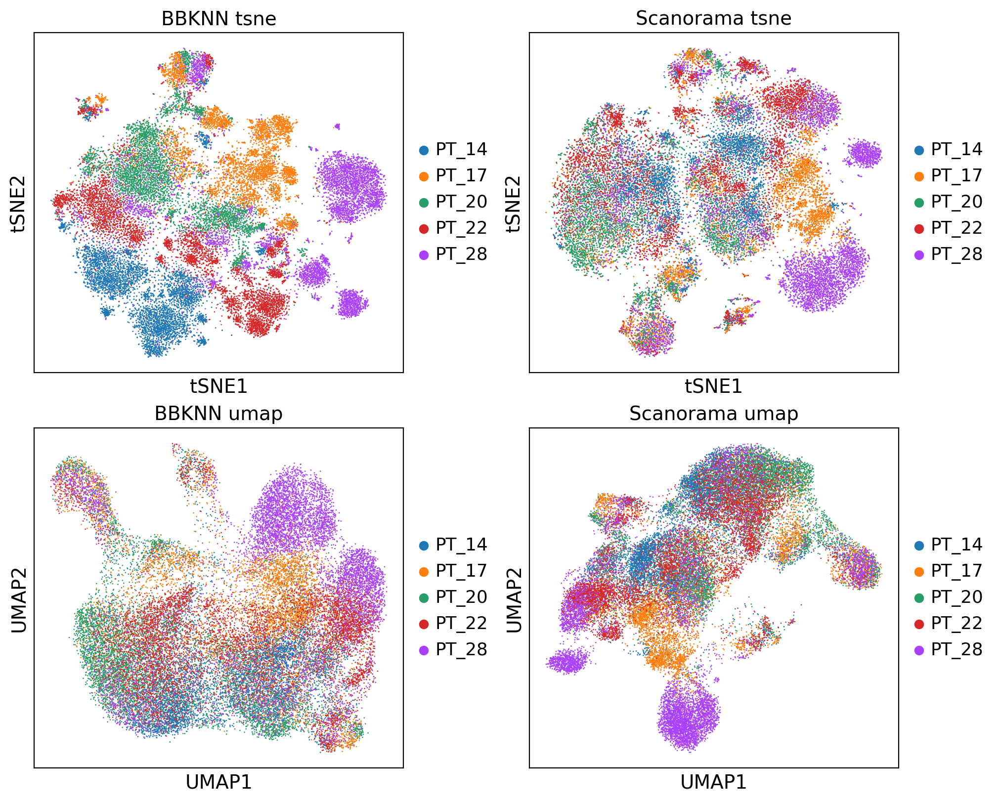

In [45]:
fig, axs = plt.subplots(2, 2, figsize=(10,8),constrained_layout=True)
sc.pl.tsne(adata_bbknn, color="Sample", title="BBKNN tsne", ax=axs[0,0], show=False)
sc.pl.tsne(adata_sc, color="Sample", title="Scanorama tsne", ax=axs[0,1], show=False)
sc.pl.umap(adata_bbknn, color="Sample", title="BBKNN umap", ax=axs[1,0], show=False)
sc.pl.umap(adata_sc, color="Sample", title="Scanorama umap", ax=axs[1,1], show=False)

In [46]:
#save to file
save_file = '/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/integracion_scanpy/integration_scanorama.h5ad'
adata_sc.write_h5ad(save_file)

/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

<Axes: title={'center': 'Scanorama'}, xlabel='UMAP1', ylabel='UMAP2'>

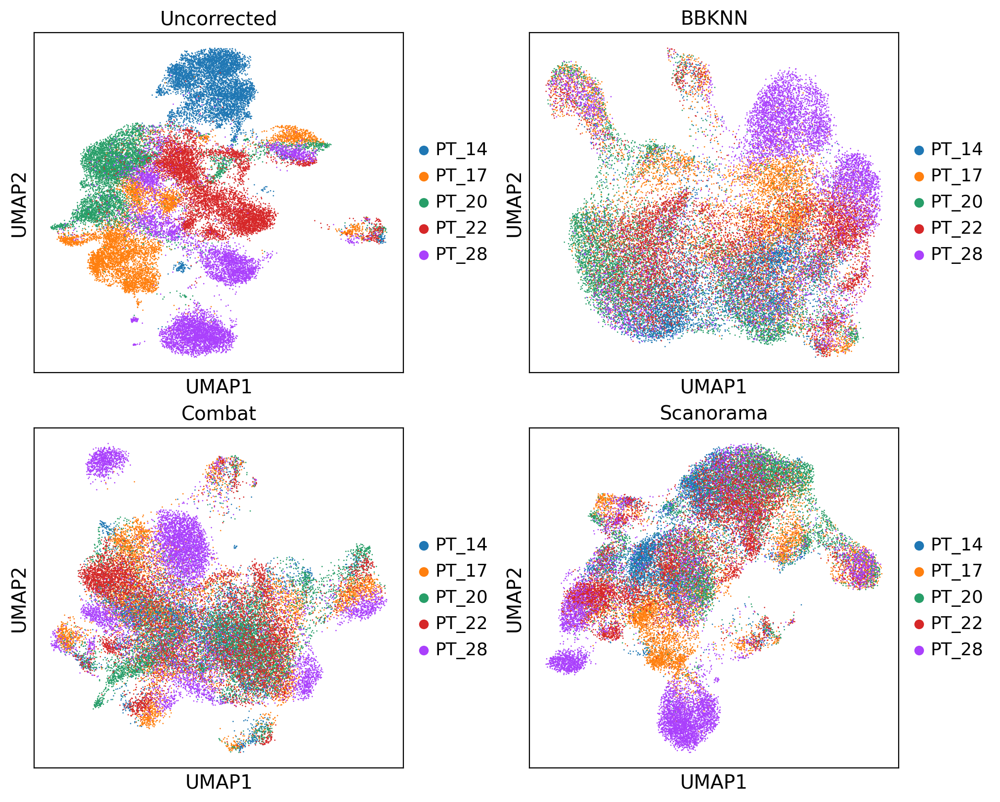

In [47]:
fig, axs = plt.subplots(2, 2, figsize=(10,8),constrained_layout=True)
sc.pl.umap(adata_no_integrated, color="Sample", title="Uncorrected", ax=axs[0,0], show=False)
sc.pl.umap(adata_bbknn, color="Sample", title="BBKNN", ax=axs[0,1], show=False)
sc.pl.umap(adata_combat, color="Sample", title="Combat", ax=axs[1,0], show=False)
sc.pl.umap(adata_sc, color="Sample", title="Scanorama", ax=axs[1,1], show=False)

#### D) Integración con Harmony 

In [7]:
import scanpy.external as sce

In [13]:
# Crear una copia para trabajar con ella y preservar el objeto original
adata_harmony = adata_concat_mixto.copy()

In [14]:
# Asegurarte de que la capa `counts_soupx_crude` está correctamente configurada como matriz principal
adata_harmony.X = adata_harmony.layers['counts_soupx_crude'].copy()

# Normalizar y aplicar log-transform
sc.pp.normalize_total(adata_harmony, target_sum=1e4)
sc.pp.log1p(adata_harmony)

In [15]:
# Detectar los 3000 genes más variables, manteniendo todos los genes en el objeto
sc.pp.highly_variable_genes(adata_harmony, n_top_genes=3000, batch_key='Sample', subset=False)

In [16]:
# Comprobar el número de genes altamente variables
num_hvg = adata_harmony.var['highly_variable'].sum()
print(f"Número de genes altamente variables: {num_hvg}")

Número de genes altamente variables: 3000


In [17]:
adata_harmony

AnnData object with n_obs × n_vars = 53542 × 23209
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg'
    layers: 'counts_soupx_crude', 'original_counts'

In [18]:
# Crear una copia temporal con solo los HVG para cálculos posteriores
hvg_data_harmony = adata_harmony[:, adata_harmony.var['highly_variable']].copy()

In [19]:
# Ajustar por covariables técnicas (por ejemplo, % mitocondria y % ribosoma)
# TARDA, NO DESESPERAR
sc.pp.regress_out(hvg_data_harmony, keys=['pct_counts_mt', 'pct_counts_ribo'])

In [20]:
hvg_data_harmony

AnnData object with n_obs × n_vars = 53542 × 3000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg'
    layers: 'counts_soupx_crude', 'original_counts'

In [21]:
# Escalar los datos de los HVG
sc.pp.scale(hvg_data_harmony, max_value=10)

In [22]:
# Calcular PCA con los HVG ajustados
sc.tl.pca(hvg_data_harmony, n_comps=50)

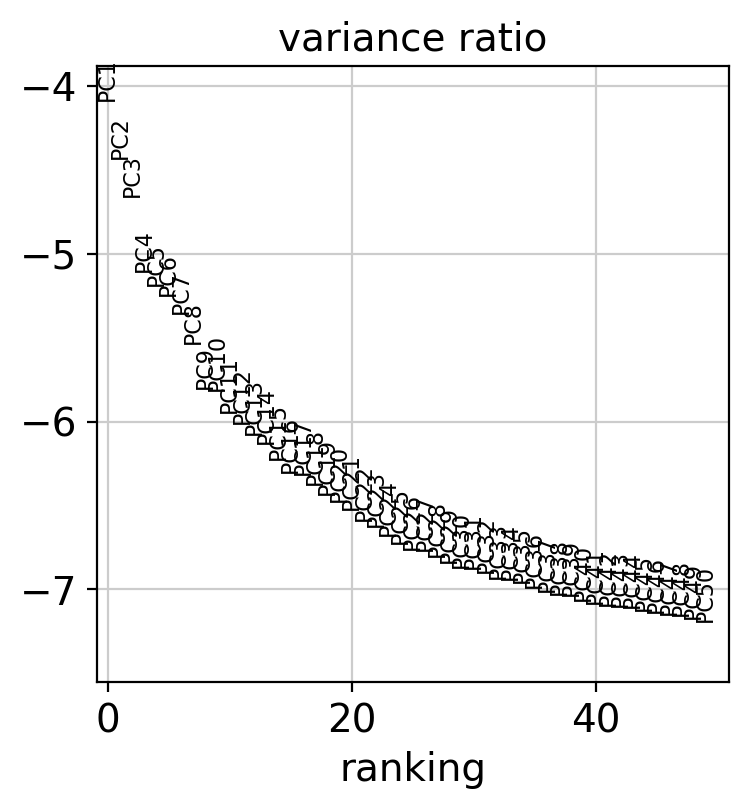

In [23]:
# Visualizar el codo para verificar el número de PCs significativas (opcional)
sc.pl.pca_variance_ratio(hvg_data_harmony, log=True, n_pcs=50)

In [24]:
# Integración con Harmony
sce.pp.harmony_integrate(hvg_data_harmony, key='Sample')

2025-01-21 11:07:04,624 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-01-21 11:07:17,956 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-01-21 11:07:18,448 - harmonypy - INFO - Iteration 1 of 10
2025-01-21 11:07:48,036 - harmonypy - INFO - Iteration 2 of 10
2025-01-21 11:08:16,630 - harmonypy - INFO - Iteration 3 of 10
2025-01-21 11:08:44,921 - harmonypy - INFO - Iteration 4 of 10
2025-01-21 11:09:08,917 - harmonypy - INFO - Iteration 5 of 10
2025-01-21 11:09:37,744 - harmonypy - INFO - Iteration 6 of 10
2025-01-21 11:09:53,342 - harmonypy - INFO - Iteration 7 of 10
2025-01-21 11:10:05,671 - harmonypy - INFO - Iteration 8 of 10
2025-01-21 11:10:18,906 - harmonypy - INFO - Iteration 9 of 10
2025-01-21 11:10:32,928 - harmonypy - INFO - Iteration 10 of 10
2025-01-21 11:10:47,832 - harmonypy - INFO - Stopped before convergence


In [25]:
# Calcular vecinos y UMAP usando las PCs integradas por Harmony
sc.pp.neighbors(hvg_data_harmony, use_rep='X_pca_harmony')
sc.tl.umap(hvg_data_harmony)

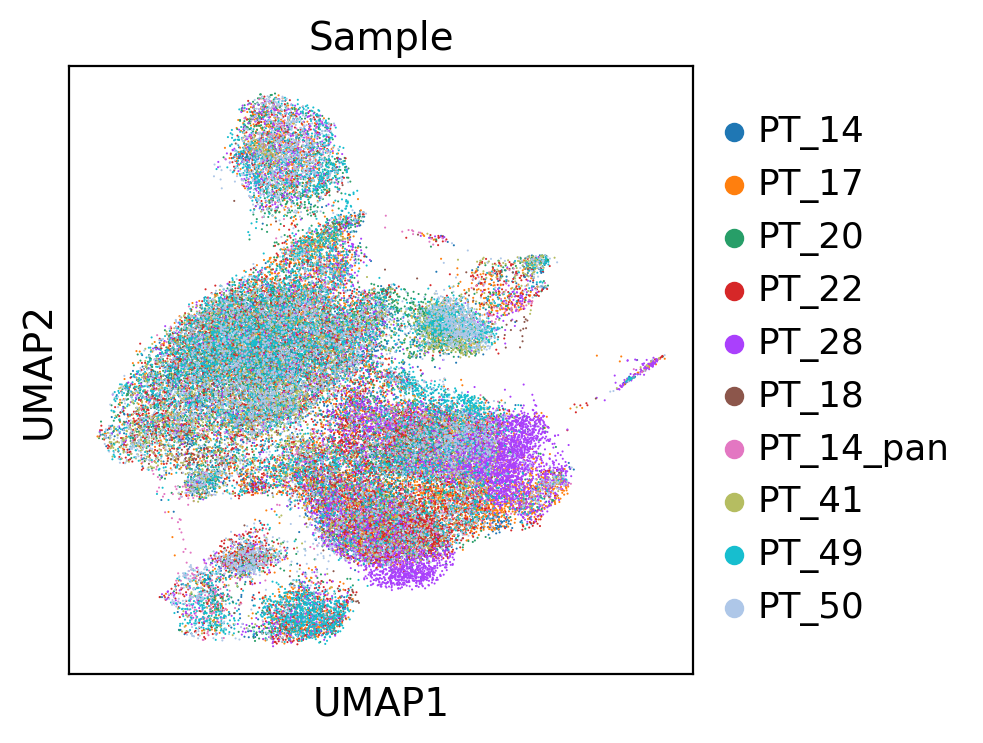

In [26]:
sc.pl.umap(hvg_data_harmony, color=['Sample'])

In [33]:
hvg_data_harmony

AnnData object with n_obs × n_vars = 53542 × 3000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'Sample_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts_soupx_crude', 'original_counts'
    obsp: 'distances', 'connectivities'

In [35]:
# Guardar las coordenadas integradas y UMAP en el objeto principal (23,000 genes)
adata_harmony.obsm['X_pca_harmony'] = hvg_data_harmony.obsm['X_pca_harmony']
adata_harmony.obsm['X_umap'] = hvg_data_harmony.obsm['X_umap']
adata_harmony.uns['neighbors'] = hvg_data_harmony.uns['neighbors']
adata_harmony.obsp['connectivities'] = hvg_data_harmony.obsp['connectivities']
adata_harmony.obsp['distances'] = hvg_data_harmony.obsp['distances']

# Mantener información sobre los genes altamente variables en el objeto principal
adata_harmony.var['highly_variable'] = hvg_data_harmony.var['highly_variable']

In [36]:
# Convertir la columna 'highly_variable' a un tipo consistente (booleano)
adata_harmony.var['highly_variable'] = adata_harmony.var['highly_variable'].astype(bool)

In [37]:
adata_harmony

AnnData object with n_obs × n_vars = 53542 × 23209
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg', 'neighbors'
    obsm: 'X_pca_harmony', 'X_umap'
    layers: 'counts_soupx_crude', 'original_counts'
    obsp: 'connectivities', 'distances'

In [38]:
adata_harmony.write("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/05_datos_integrados/adata_harmony_10_pt.h5ad")

#### D) Integración con BBKKN

In [145]:
# Crear una copia para trabajar con ella y preservar el objeto original
adata_BBKKN = adata_concat_mixto.copy()

In [146]:
# Asegurarte de que la capa `counts_soupx_crude` está correctamente configurada como matriz principal
adata_BBKKN.X = adata_BBKKN.layers['counts_soupx_crude'].copy()

# Normalizar y aplicar log-transform
sc.pp.normalize_total(adata_BBKKN, target_sum=1e4)
sc.pp.log1p(adata_BBKKN)

In [147]:
# Detectar los 3000 genes más variables, manteniendo todos los genes en el objeto
sc.pp.highly_variable_genes(adata_BBKKN, n_top_genes=3000, batch_key='Sample', subset=False)

In [148]:
# Crear una copia temporal con solo los HVG para cálculos posteriores
hvg_data_bbkkn = adata_BBKKN[:, adata_BBKKN.var['highly_variable']].copy()

In [149]:
sc.pp.regress_out(hvg_data_bbkkn, keys=['pct_counts_mt', 'pct_counts_ribo'])

In [150]:
hvg_data_bbkkn

AnnData object with n_obs × n_vars = 53542 × 3000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg'
    layers: 'counts_soupx_crude', 'original_counts'

In [151]:
# Escalar los datos después de la regresión
sc.pp.scale(hvg_data_bbkkn, max_value=10)

In [152]:
# Calcular PCA
sc.tl.pca(hvg_data_bbkkn, n_comps=50)

In [153]:
import bbknn
sc.external.pp.bbknn(hvg_data_bbkkn, batch_key='Sample', computation='memory')

In [154]:
sc.tl.umap(hvg_data_bbkkn)

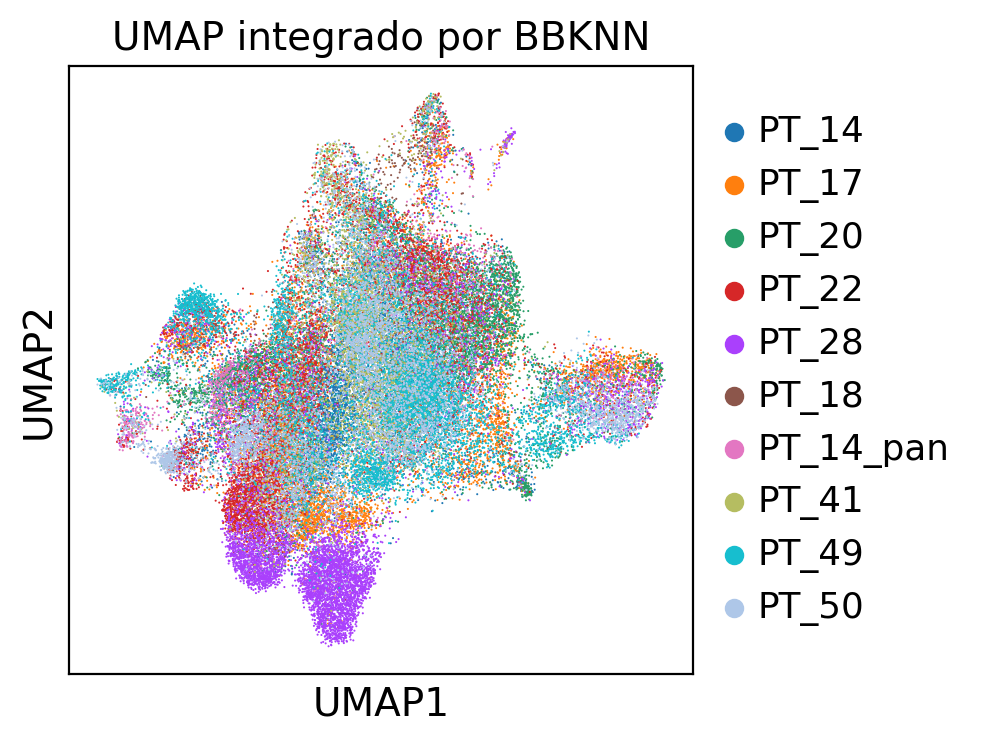

In [155]:
sc.pl.umap(hvg_data_bbkkn, color='Sample', title="UMAP integrado por BBKNN")

In [156]:
hvg_data_bbkkn

AnnData object with n_obs × n_vars = 53542 × 3000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'Sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts_soupx_crude', 'original_counts'
    obsp: 'distances', 'connectivities'

In [168]:
# Transferir las coordenadas de PCA y UMAP de BBKNN al objeto adata_concat_mixto
adata_concat_mixto.obsm['X_pca_bbknn'] = hvg_data_bbkkn.obsm['X_pca']  # O ajusta a 'X_pca_bbknn' si prefieres
adata_concat_mixto.obsm['X_umap'] = hvg_data_bbkkn.obsm['X_umap']

# Transferir la información de los vecinos (neighbors) de BBKNN
adata_concat_mixto.uns['neighbors_bbknn'] = hvg_data_bbkkn.uns['neighbors']

# Transferir las matrices de conectividad y distancias de BBKNN
adata_concat_mixto.obsp['connectivities_bbknn'] = hvg_data_bbkkn.obsp['connectivities']
adata_concat_mixto.obsp['distances_bbknn'] = hvg_data_bbkkn.obsp['distances']

# También puedes transferir las variables altamente variables de BBKNN
adata_concat_mixto.var['highly_variable_bbknn'] = hvg_data_bbkkn.var['highly_variable']

In [169]:
adata_concat_mixto

AnnData object with n_obs × n_vars = 53542 × 23209
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'highly_variable_bbknn'
    uns: 'neighbors_bbknn'
    obsm: 'X_pca_bbknn', 'X_umap'
    layers: 'counts_soupx_crude', 'original_counts'
    obsp: 'connectivities_bbknn', 'distances_bbknn'

In [ ]:
adata_concat_mixto.write("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/adata_bbkkn_10_pt.h5ad")

### Integracion Scanpy más manual y ligeramente diferente a lo anterior

In [6]:
#integracion con scanpy
!sbatch /data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/scripts_complementarios/run_scanpy_integration.sh

In [8]:
#esto lo evitariamos si el numero de genes es mucho mayor que el de celulas.
#hacemos la prueba para los 3000 más expresados. Como estamos en un punto intermedio, no lo haremos, prefiero usar todos los genes.
sc.pp.highly_variable_genes(
    adata_int_scVI,
    flavor='seurat_v3',
    n_top_genes=3000,
    layer='counts_soupx_crude',  # Asegúrate de que esta es la capa correcta
    batch_key='Sample',  # Ajustar por batch según 'Sample'
    subset=True,  # Subconjunto de los genes seleccionados
)

In [9]:
adata_concat_mixto

AnnData object with n_obs × n_vars = 32370 × 3000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample', 'n_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg'
    layers: 'counts_soupx_crude', 'raw_counts', 'soupX_counts'

In [7]:
# Integrar los datos procesados con scanpy

pt_14 = sc.read("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/integracion_scanpy/pt_14_processed.h5ad")
pt_17 = sc.read("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/integracion_scanpy/pt_17_processed.h5ad")
pt_20 = sc.read("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/integracion_scanpy/pt_20_processed.h5ad")
pt_22 = sc.read("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/integracion_scanpy/pt_22_processed.h5ad")
pt_28 = sc.read("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/integracion_scanpy/pt_28_processed.h5ad")

# Etiquetar los samples en cada paciente
pt_14.obs['Sample'] = 'pt_14'
pt_17.obs['Sample'] = 'pt_17'
pt_20.obs['Sample'] = 'pt_20'
pt_22.obs['Sample'] = 'pt_22'
pt_28.obs['Sample'] = 'pt_28'

# Usar PT_22 como referencia para la intersección de genes
var_names = pt_22.var_names

# Hacer la intersección de los otros pacientes con los genes de PT_22
var_names = var_names.intersection(pt_14.var_names)
var_names = var_names.intersection(pt_17.var_names)
var_names = var_names.intersection(pt_20.var_names)
var_names = var_names.intersection(pt_28.var_names)

# Filtrar los genes en cada paciente basado en los genes comunes con PT_22
pt_14 = pt_14[:, var_names]
pt_17 = pt_17[:, var_names]
pt_20 = pt_20[:, var_names]
pt_22 = pt_22[:, var_names]  # Este ya es el de referencia, pero lo incluimos para consistencia
pt_28 = pt_28[:, var_names]

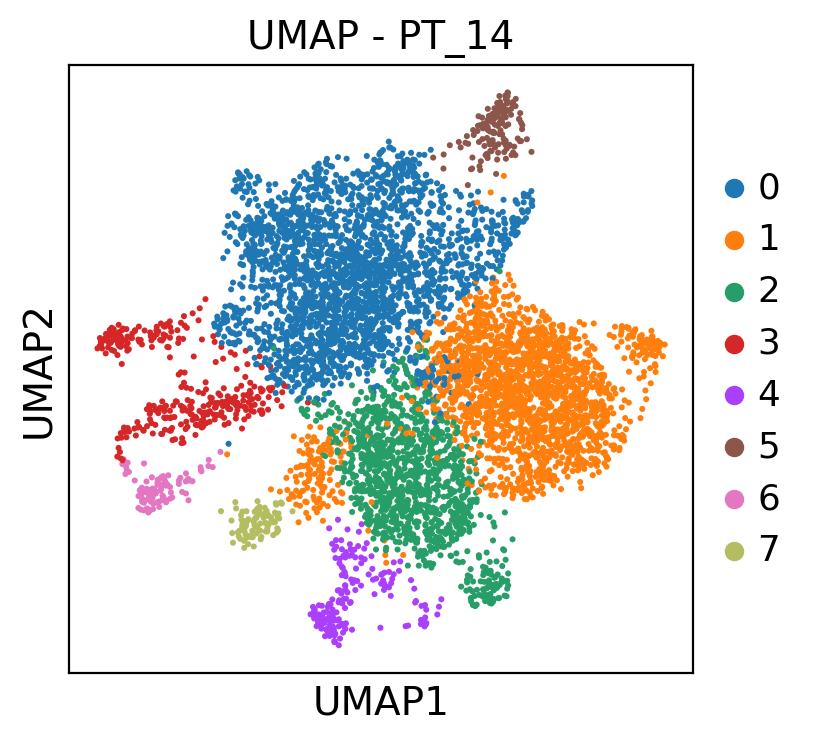

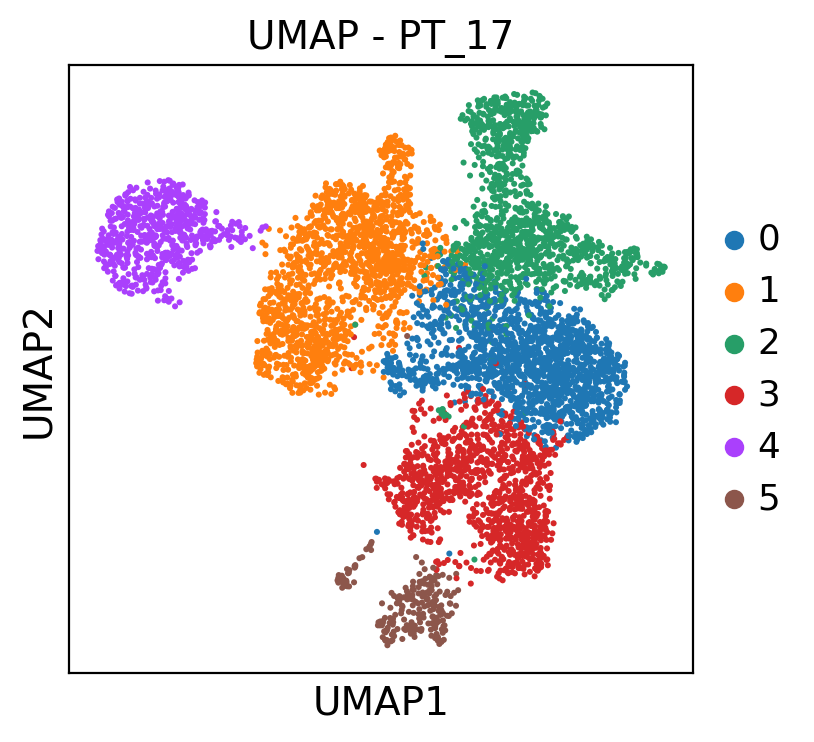

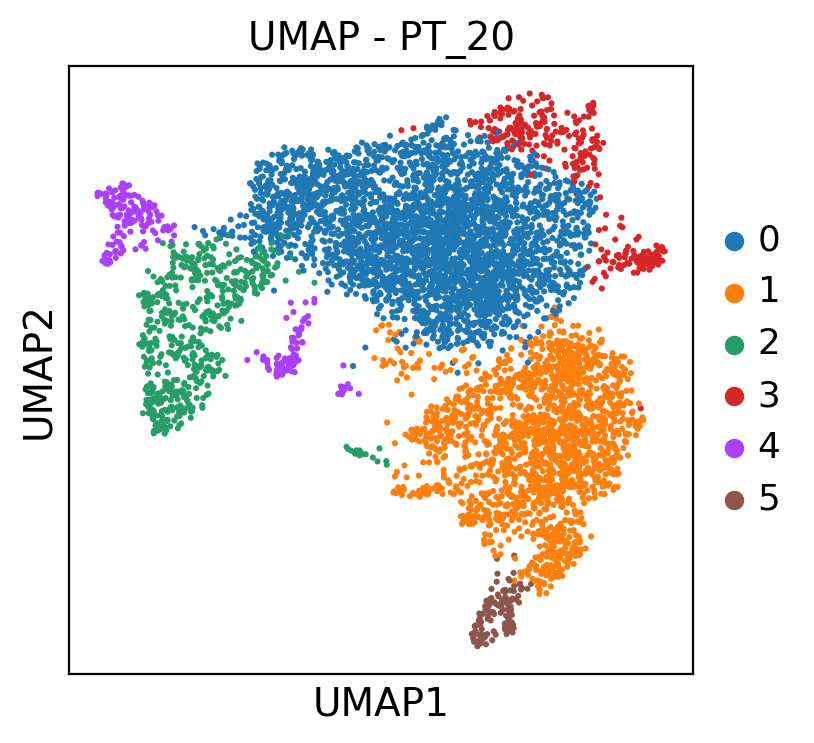

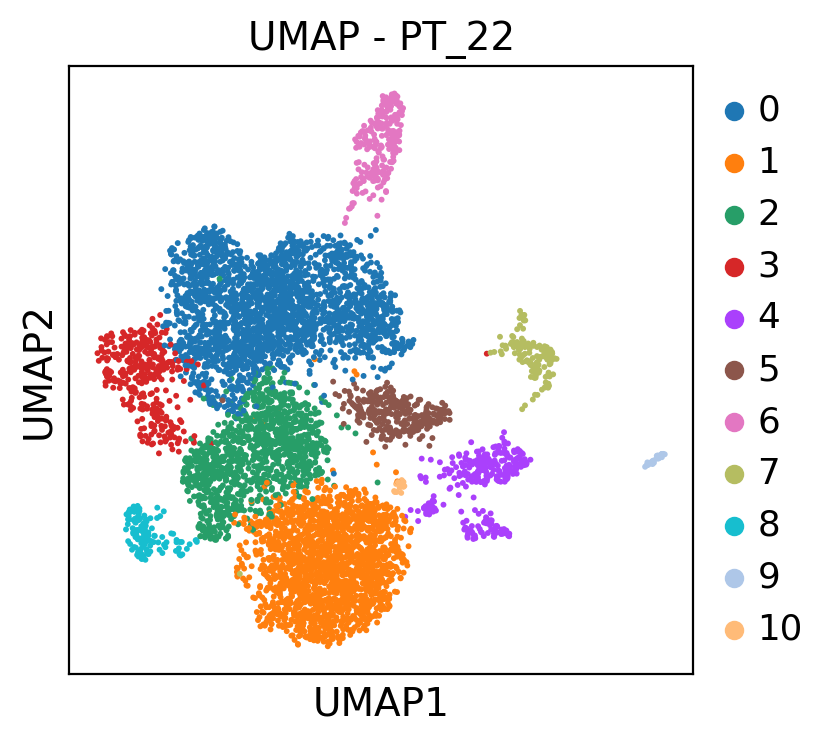

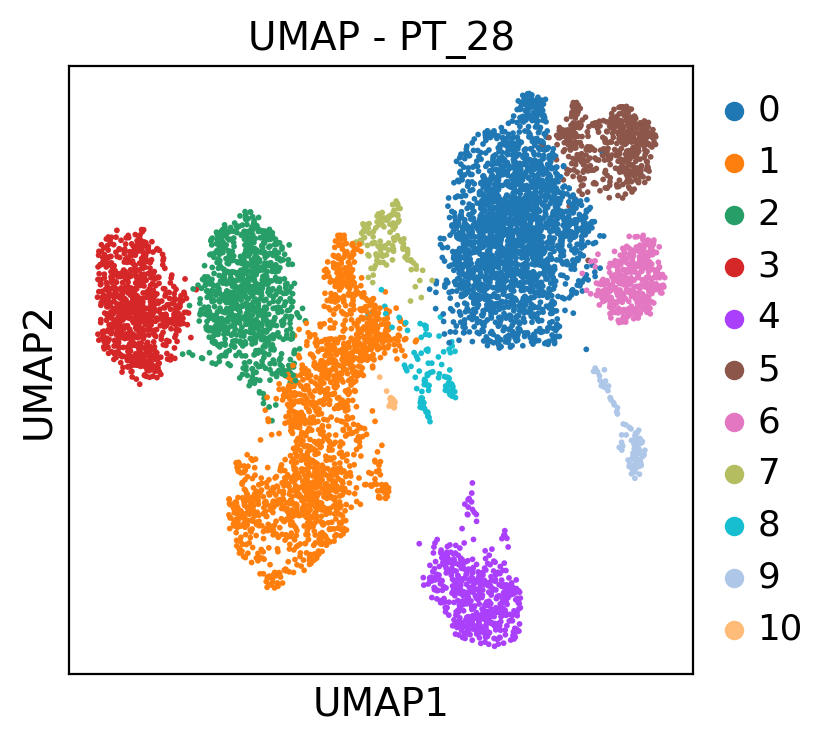

In [8]:
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(pt_14, color = 'leiden', title="UMAP - PT_14")
    sc.pl.umap(pt_17, color = 'leiden', title="UMAP - PT_17")
    sc.pl.umap(pt_20, color = 'leiden', title="UMAP - PT_20")
    sc.pl.umap(pt_22, color = 'leiden', title="UMAP - PT_22")
    sc.pl.umap(pt_28, color = 'leiden', title="UMAP - PT_28")

In [15]:
#Usar ingest para proyectar los otros datasets sobre el conjunto pt_22
# Proyectar pt_14 en el análisis de pt_22
sc.tl.ingest(pt_14, pt_22, obs='leiden')

# Proyectar pt_17 en el análisis de pt_22
sc.tl.ingest(pt_17, pt_22, obs='leiden')

# Proyectar pt_20 en el análisis de pt_22
sc.tl.ingest(pt_20, pt_22, obs='leiden')

# Proyectar pt_28 en el análisis de pt_22
sc.tl.ingest(pt_28, pt_22, obs='leiden')


2024-09-24 14:57:51.984915: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-24 14:57:51.989393: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-24 14:57:52.003286: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-24 14:57:52.024520: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-24 14:57:52.031119: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-24 14:57:52.051015: I tensorflow/core/platform/cpu_feature_gu

In [16]:
# Concatenar los datasets proyectados
merged = pt_22.concatenate(pt_14, pt_17, pt_20, pt_28)

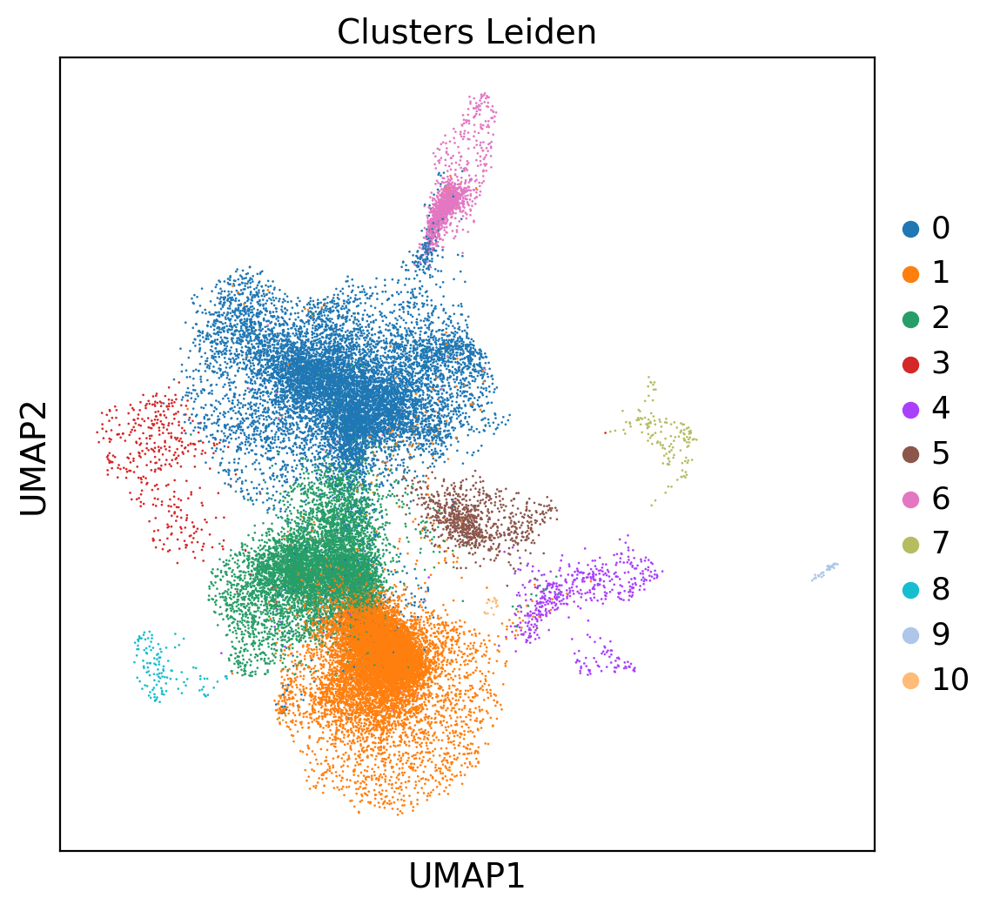

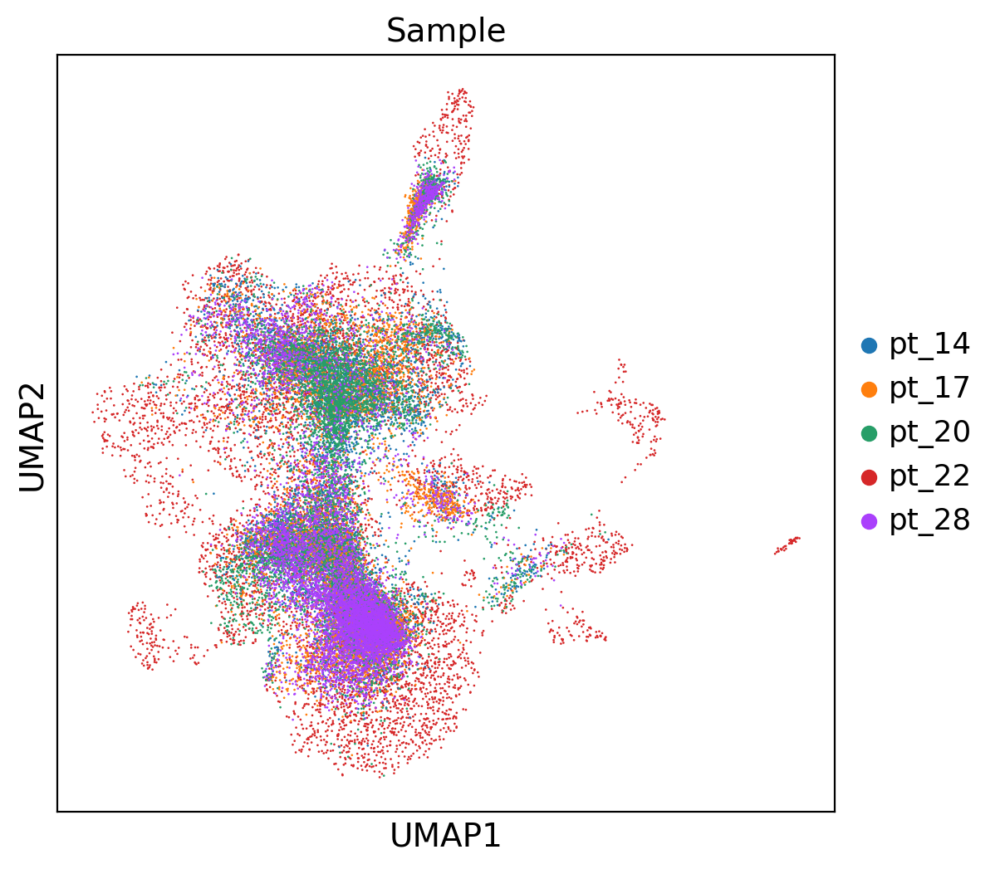

In [17]:
# Visualizar el UMAP con Leiden
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(merged, color='leiden', frameon=True, title='Clusters Leiden', legend_loc='right margin')

# Visualizar el UMAP por Sample
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(merged, color='Sample', frameon=True, title='Sample', legend_loc='right margin')


In [18]:
# Contar el número de células por paciente y ordenarlos de PT_14 a PT_28
cell_counts_per_patient = merged.obs['Sample'].value_counts()
cell_counts_per_patient = cell_counts_per_patient.reindex(['pt_14', 'pt_17', 'pt_20', 'pt_22', 'pt_28'])

# Mostrar el número de células por paciente ordenado
print(cell_counts_per_patient)

Sample
pt_14    6291
pt_17    6304
pt_20    6128
pt_22    6667
pt_28    6980
Name: count, dtype: int64


In [ ]:
# Crear un UMAP separado por paciente (Sample)
for sample in merged.obs['Sample'].unique():
    # Filtrar los datos para cada paciente
    adata_sample = merged[merged.obs['Sample'] == sample, :]
    
    # Visualizar UMAP y clusters de Leiden para cada paciente
    with rc_context({'figure.figsize': (6, 6)}):
        sc.pl.umap(adata_sample, color='leiden', frameon=False, title=f'Clusters Leiden - {sample}', legend_loc='right margin')

NOS QUEDAMOS CON HARMONY